## Calculating the NDVI with Sentinel 2 Data Using Python Rasterio
This is an example for how python may be used to retrieve information from satellite imagery, such as the images from Sentinel 2 provided by ESA. The data used below stems from the Copernicus Open Access Hub (https://scihub.copernicus.eu/dhus/#/home). The images downloaded cover the entire Rhine-Main area in central Germany, as well as other parts of eastern Rhineland-Palatinate and western Hesse. I downloaded one image for March, May, June, July, September, October and December 2021, respectively. The product comes as a zip file named something like S2A_MSIL2A_20210330T103021_N0300_R108_T32UMA_20210330T151921.zip (this is the name of the image that was shot on March 30, 2021). The objective is to calculate the normalized difference vegetation index (NDVI) for different locations around the city of Mainz throughout the year. The structure of this notebook is as follows: <br>
1. Set the scene by importing the necessary libraries and retrieving necessariy information about the satellite data
2. Calculate the NDVI for <br>
    2.1 cropland<br>
    2.2 forest<br>
    2.3 vineyards<br>
    2.4 an urban area<br>
3. compare the NDVIs of the four land usage types <br>

Note that the considered region (Rheinhessen) is densely populated and land is used quite heterogenously, which makes it hard to find larger areas where we find _only_ cropland, forest or vineyards. However, the idea here is just to provide a basic idea of how satellite imagery may be used with python and to show the potential of freely available satellite imagery for various applications.

### 1. Setting the Scene
First, we need to import some libraries. Note that the installation of rasterio is not very straightforward, but there are some tutorials on Youtube or information on stackoverflow in case you run into any issues.   

In [ ]:
import rasterio
from rasterio import plot
import matplotlib.pyplot as plt
%matplotlib inline
import numpy as np
from rasterio.plot import show
from rasterio.windows import from_bounds
from rasterio.enums import Resampling
from skimage import exposure
from shapely.geometry import box
from PIL import Image
import pandas as pd
import seaborn as sns

In [331]:
"""here the file path to access the data is set. Note that I opened the zip files that come from the 
copernicus open access hub and then saved the necessary color bands seperately. in the dictionary "date_and_time"
the timestamps of each satellite product is indicated. The selected bands are red, green and blue as well as near infrared.
"""
imagePath = 'C:/Users/Josef/Sentinel/RUS/'
date_and_time={'march':'20210330T103021', 'may':'20210509T103021', 'june':'20210613T102559', 'july':'20210718T103031',
              'september':'20210906T103021', 'october':'20211001T102739', 'december':'20211220T103339'}

selected_bands=['B04','B03', 'B02', 'B08'] #red, green, blue, near infrared

In [332]:
#import any color band just to have a look at the dimensions and the coordinates of the image.
# An explanation of how rasterio works with coordinates and what "bounds" means can be found here: https://rasterio.readthedocs.io/en/latest/quickstart.html
testband = rasterio.open(imagePath+'may'+' 21 bands 2348/T32UMA_'+date_and_time['may']+'_'+'B02'+'_10m.jp2', driver='JP2OpenJPEG') #blue
testband.bounds

BoundingBox(left=399960.0, bottom=5490240.0, right=509760.0, top=5600040.0)

In [333]:
ulc=(testband.bounds[0], testband.bounds[3]) #upper left corner of the image

In [334]:
"""
Here we navigate on the image to find the city of Mainz. I did this with trial and error, there certainly must be 
a better way. I navigate from the upper left corner by indicating how far the upper left corner of the section that
only contains Mainz and the surrounding area is south and east of the top left corner in metres. The variable "sizeinm" 
is the size of the window that we want to display. Note that the larger the window the longer it takes to load. 
One pixel represents an area of 10x10m so if "sizeinm" are 10000m the picture has 1000x1000 pixel. 
"""
sizeinm=10000
MZtop=ulc[1]-55700
MZleft=ulc[0]+41000
MZbottom=MZtop-sizeinm
MZright=MZleft+sizeinm


In [335]:
#Let's import the data to display an rgb natural color image of Mainz in May
with rasterio.open(imagePath+'may'+' 21 bands 2348/T32UMA_'+date_and_time['may']+'_'+'B04'+'_10m.jp2') as src:
    red = src.read(1,window=from_bounds(MZleft, MZbottom, MZright,MZtop, src.transform))
with rasterio.open(imagePath+'may'+' 21 bands 2348/T32UMA_'+date_and_time['may']+'_'+'B03'+'_10m.jp2') as src:
    green = src.read(1,window=from_bounds(MZleft, MZbottom, MZright,MZtop, src.transform))
with rasterio.open(imagePath+'may'+' 21 bands 2348/T32UMA_'+date_and_time['may']+'_'+'B02'+'_10m.jp2') as src:
    blue = src.read(1,window=from_bounds(MZleft, MZbottom, MZright,MZtop, src.transform))


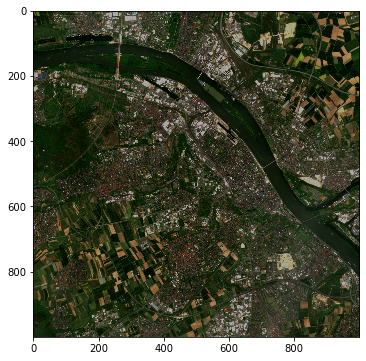

In [336]:
rgb = np.dstack((red, green, blue))
p2, p98 = np.percentile(rgb, (2,98))
#the color bands need to be normalized to ensure correct displaying. 
image = exposure.rescale_intensity(rgb, in_range=(p2, p98)) / 100000 
plt.figure(figsize=(6,6))
show(image.transpose(2,0,1))

### 2.1 Calculating the NDVI for cropland
The section chosen to calculate the NDVI for cropland also contains streets and buildings. The crops cultivated are mainly winter wheat, winter and summer barley and potentially some sugarbeets or potatoes, as well as strawberries and some vegetables (mainly cabbage).

In [337]:
"""
First, let's navigate to a section of the image that (predominantly) represents cropland. The navigation is relative to the 
upper left corner that defines the coordinates of Mainz. You will see that the selected section also includes 
some buildings as well as the football stadium of Mainz 05.
"""
nofMainz=-6000  #north of Mainz in m (negative if south)
eofMainz=2000  #east of Mainz in m (negative if west)
sizeinm=2000
top=MZtop+nofMainz
left=MZleft+eofMainz
bottom=top-sizeinm
right=left+sizeinm

In [338]:
all_images_cropland = np.zeros(shape=(len(date_and_time.keys()),len(selected_bands),200,200),dtype=np.uint16) #construct an empty array
for m,month in enumerate(date_and_time.keys()):
    for b,band in enumerate(selected_bands):
        with rasterio.open(imagePath+month+' 21 bands 2348/T32UMA_'+date_and_time[month]+'_'+band+'_10m.jp2', driver='JP2OpenJPEG') as src:
            all_images_cropland[m][b] = src.read(1,window=from_bounds(left, bottom, right, top, src.transform))

month: march


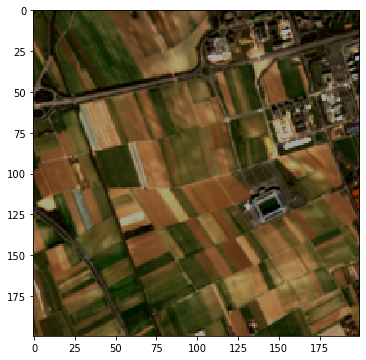

month: may


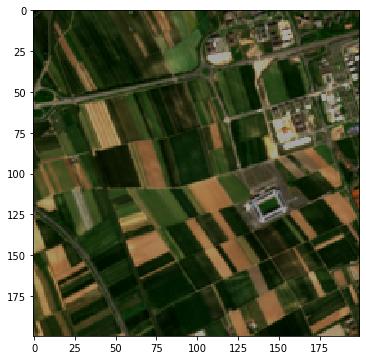

month: june


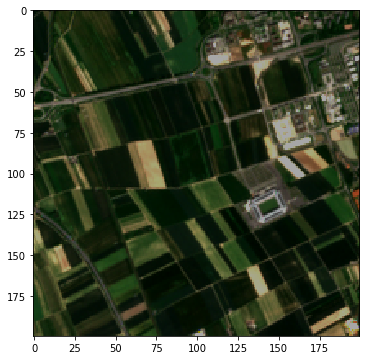

month: july


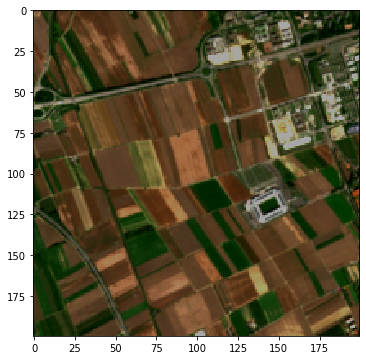

month: september


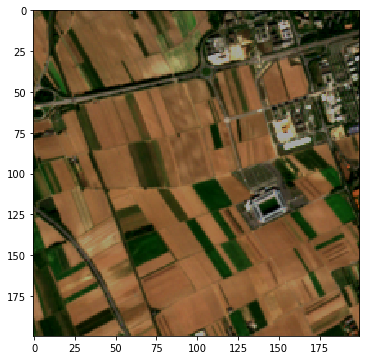

month: october


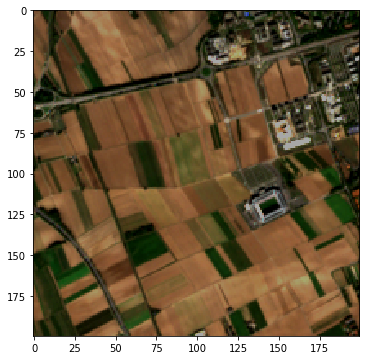

month: december


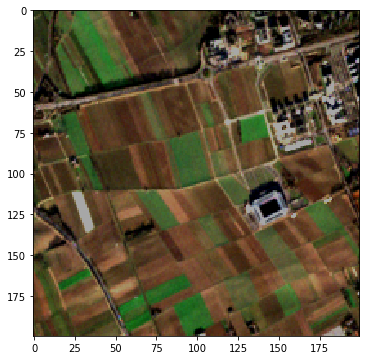

In [339]:
# Create RGB natural color composite
for m,month in enumerate(date_and_time.keys()):
    rgb = np.dstack((all_images_cropland[m][0], all_images_cropland[m][1], all_images_cropland[m][2]))
    p2, p98 = np.percentile(rgb, (2,98))
    image = exposure.rescale_intensity(rgb, in_range=(p2, p98)) / 100000
    plt.figure(figsize=(6,6))
    print(f'month: {month}')
    show(image.transpose(2,0,1))

The NDVI indicates how healthy/green the vegetation is and is calculated as the difference between the near infrared light reflectation and the red reflectation of vegetation, divided by the sum of the two. See an explanation here: https://gisgeography.com/ndvi-normalized-difference-vegetation-index/ <br>
Generally, the closer the NDVI to one the more healthy or green the vegetation. 

In [340]:
all_ndvis_cropland = np.zeros(shape=(len(date_and_time.keys()),200,200))
for m,month in enumerate(date_and_time.keys()):
    ndvi_month=np.where((all_images_cropland[m][3]+all_images_cropland[m][0])==0, 0, (all_images_cropland[m][3]-all_images_cropland[m][0])/(all_images_cropland[m][3]+all_images_cropland[m][0]))
    ndvi_month_corrected=np.zeros(shape=[200, 200])
    for i in range(200):
        ndvirow=ndvi_month[i].tolist()
        ndvi_month_corrected[i]=np.asarray([0.0 if x>1 else x for x in ndvirow])
    all_ndvis_cropland[m]=ndvi_month_corrected

NDVI march


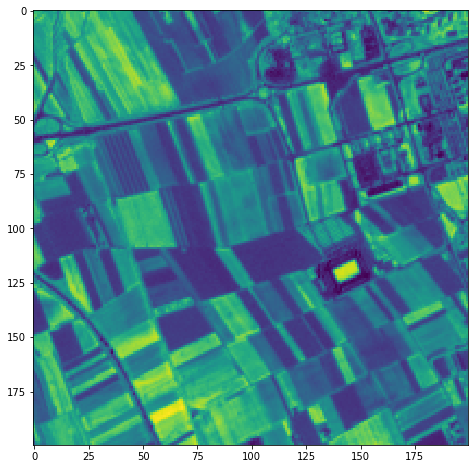

NDVI may


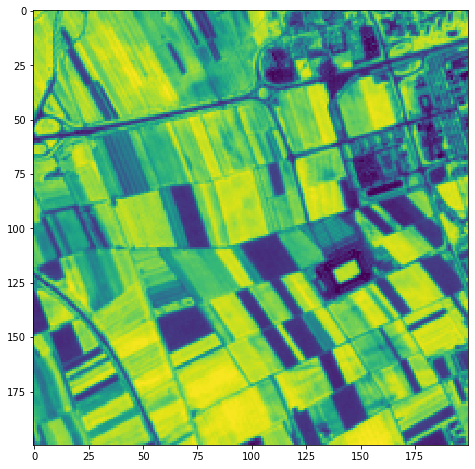

NDVI june


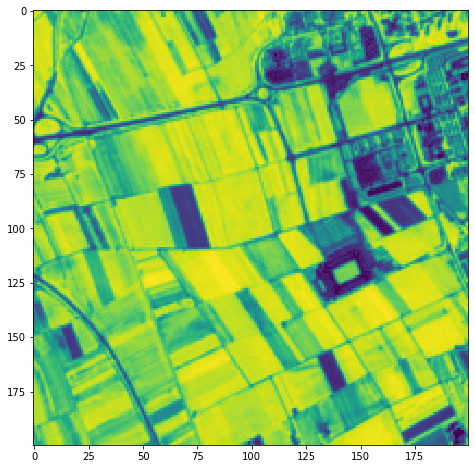

NDVI july


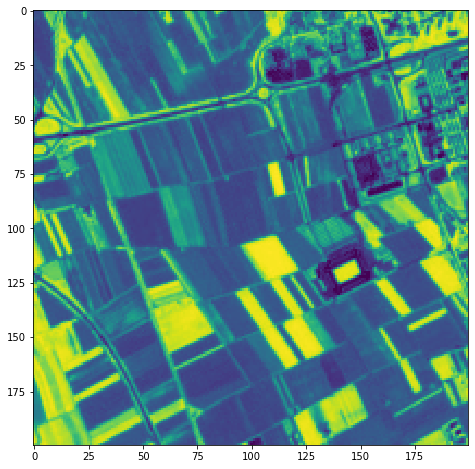

NDVI september


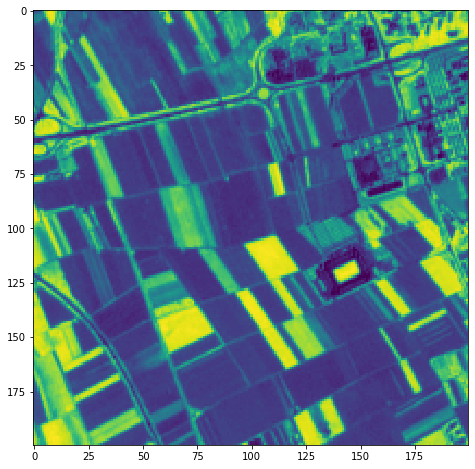

NDVI october


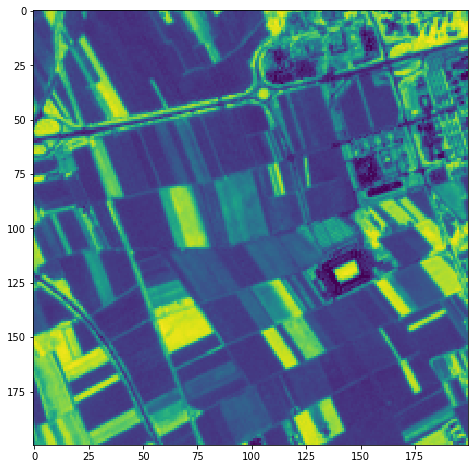

NDVI december


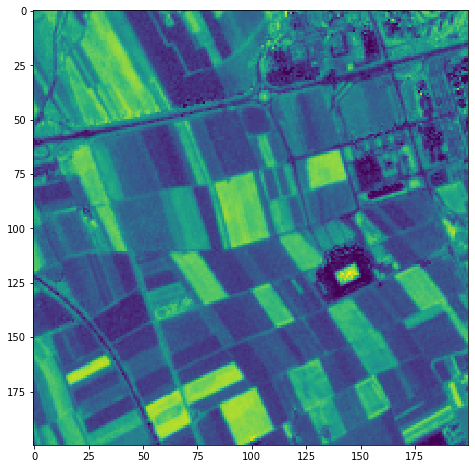

In [300]:
for m,month in enumerate(date_and_time.keys()):
    print(f'NDVI {month}')
    plt.figure(figsize=(8,8))
    show(all_ndvis_cropland[m])


Text(0.5, 1.0, 'change of (summed) NDVI over time')

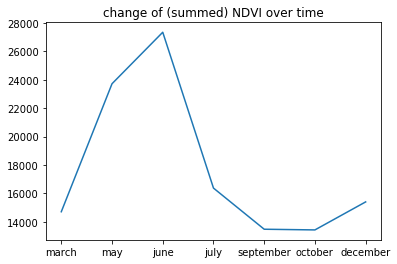

In [341]:
#let's plot the sum of the NDVI (the sum of the NDVIs of every pixel in the picture) for every month in the sample
month_2021, sum_of_ndvi =[],[]
for m,month in enumerate(date_and_time.keys()):
    month_2021.append(month)
    sum_of_ndvi.append(np.sum(all_ndvis_cropland[m]))
    
plt.plot(month_2021, sum_of_ndvi)
plt.title('change of (summed) NDVI over time')

The harvest of the winter crops in early July explains the harsh drop of the NDVI between June and July. The reason for the increase of the NDVI between october and november are presumably the winter crops for the following year or catch crops that cover the soil over the winter. 

### 2.2 Calculating the NDVI for Forest
A forest area close to the city is chosen. The process implemented for the cropland is now repeated for this section with forest land. 

In [342]:
nofMainz=-3500  #north of Mainz in m (negative if south)
eofMainz=0  #east of Mainz in m (negative if west)
sizeinm=2000
top=MZtop+nofMainz
left=MZleft+eofMainz
bottom=top-sizeinm
right=left+sizeinm

In [343]:
all_images_forest = np.zeros(shape=(len(date_and_time.keys()),len(selected_bands),200,200),dtype=np.uint16)
for m,month in enumerate(date_and_time.keys()):
    for b,band in enumerate(selected_bands):
        with rasterio.open(imagePath+month+' 21 bands 2348/T32UMA_'+date_and_time[month]+'_'+band+'_10m.jp2', driver='JP2OpenJPEG') as src:
            all_images_forest[m][b] = src.read(1,window=from_bounds(left, bottom, right, top, src.transform))

month: march


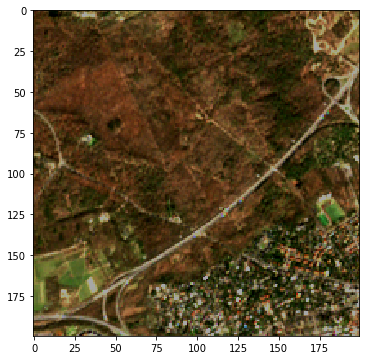

month: may


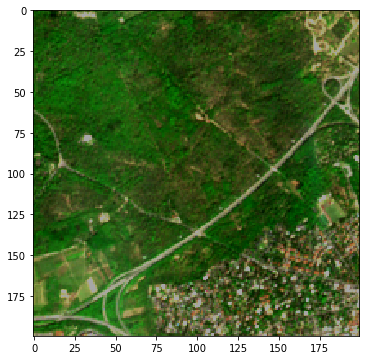

month: june


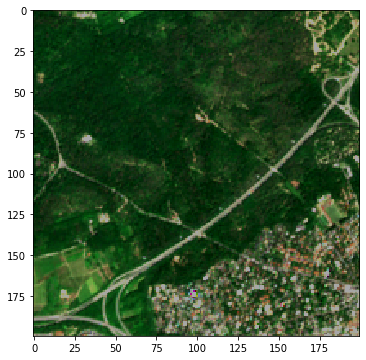

month: july


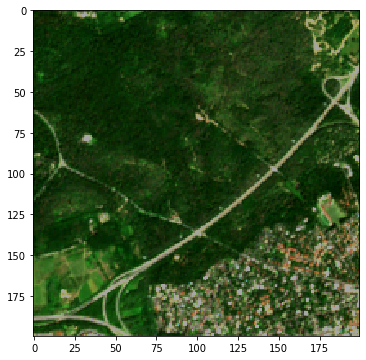

month: september


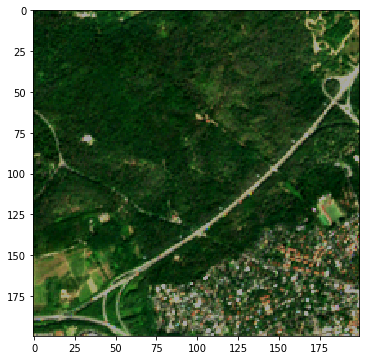

month: october


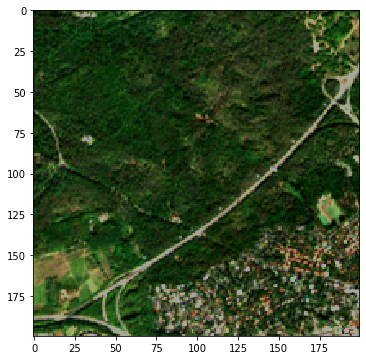

month: december


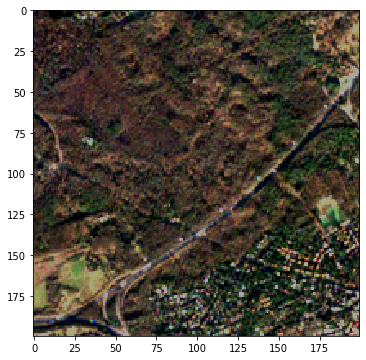

In [344]:
# Create RGB natural color composite
for m,month in enumerate(date_and_time.keys()):
    rgb = np.dstack((all_images_forest[m][0], all_images_forest[m][1], all_images_forest[m][2]))
    p2, p98 = np.percentile(rgb, (2,98))
    image = exposure.rescale_intensity(rgb, in_range=(p2, p98)) / 100000
    plt.figure(figsize=(6,6))
    print(f'month: {month}')
    show(image.transpose(2,0,1))

In [345]:
all_ndvis_forest = np.zeros(shape=(len(date_and_time.keys()),200,200))

for m,month in enumerate(date_and_time.keys()):
    ndvi_month=np.where((all_images_forest[m][3]+all_images_forest[m][0])==0, 0, (all_images_forest[m][3]-all_images_forest[m][0])/(all_images_forest[m][3]+all_images_forest[m][0]))
    ndvi_month_corrected=np.zeros(shape=[200, 200])
    for i in range(200):
        ndvirow=ndvi_month[i].tolist()
        ndvi_month_corrected[i]=np.asarray([0.0 if x>1 else x for x in ndvirow])
    all_ndvis_forest[m]=ndvi_month_corrected

NDVI march


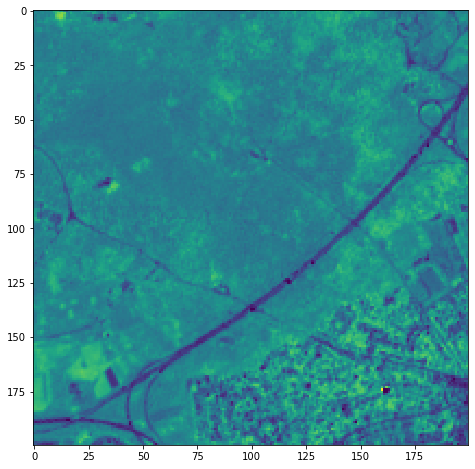

NDVI may


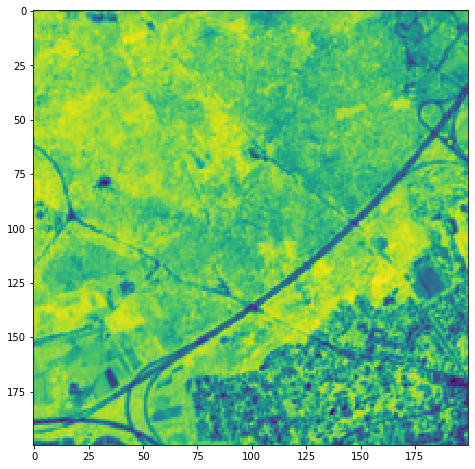

NDVI june


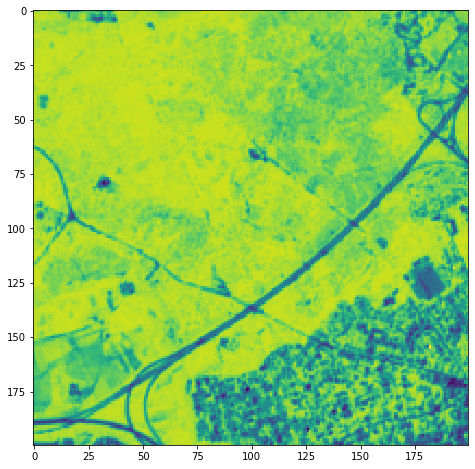

NDVI july


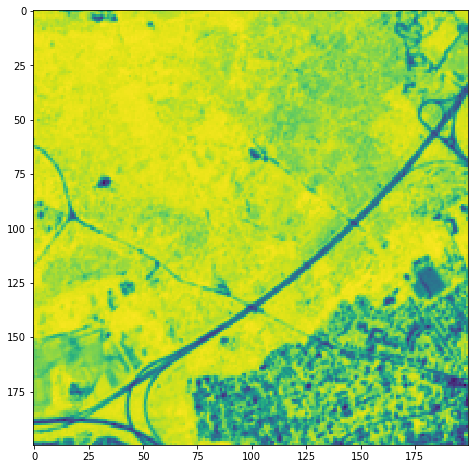

NDVI september


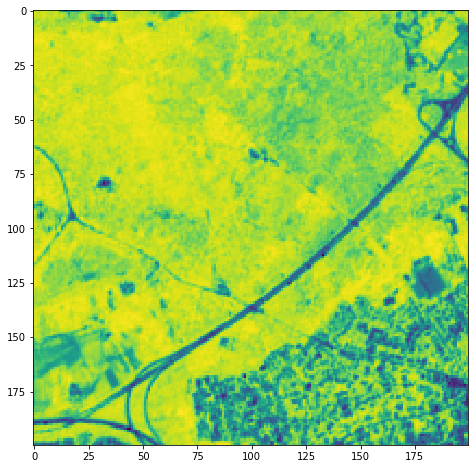

NDVI october


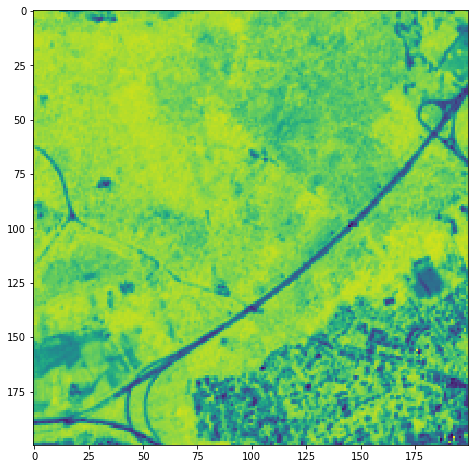

NDVI december


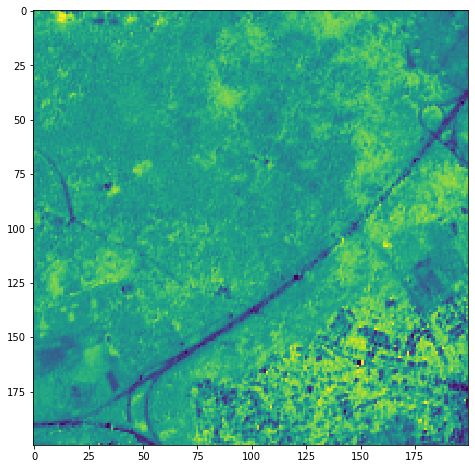

In [346]:
for m,month in enumerate(date_and_time.keys()):
    print(f'NDVI {month}')
    plt.figure(figsize=(8,8))
    show(all_ndvis_forest[m])


Text(0.5, 1.0, 'change of (summed) NDVI over time')

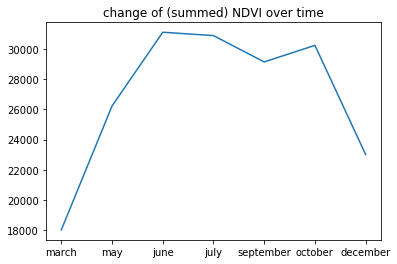

In [347]:
month_2021, sum_of_ndvi =[],[]
for m,month in enumerate(date_and_time.keys()):
    month_2021.append(month)
    sum_of_ndvi.append(np.sum(all_ndvis_forest[m]))
    
plt.plot(month_2021, sum_of_ndvi)
plt.title('change of (summed) NDVI over time')

### 2.3 Calculating the NDVI for land predominantly covered by vineyards
The section displayed here is an excerpt of the vineyards north of Nierstein, named "roter Hang". Note that the satellite images reveal that the soil has a reddish color. On the right side of the image, you can see the river Rhine (which has an NDVI near 0). In the top left corner there are some crop fields. 

In [348]:
nofMainz=-17200  #north of Mainz in m (negative if south)
eofMainz=9700  #east of Mainz in m (negative if west)
sizeinm=2000
top=MZtop+nofMainz
left=MZleft+eofMainz
bottom=top-sizeinm
right=left+sizeinm

In [349]:
all_images_vine = np.zeros(shape=(len(date_and_time.keys()),len(selected_bands),int(sizeinm/10),int(sizeinm/10)),dtype=np.uint16)
for m,month in enumerate(date_and_time.keys()):
    for b,band in enumerate(selected_bands):
        with rasterio.open(imagePath+month+' 21 bands 2348/T32UMA_'+date_and_time[month]+'_'+band+'_10m.jp2', driver='JP2OpenJPEG') as src:
            all_images_vine[m][b] = src.read(1,window=from_bounds(left, bottom, right, top, src.transform))

month: march


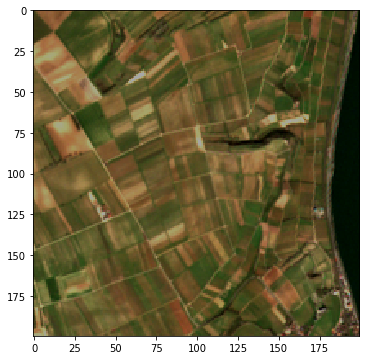

month: may


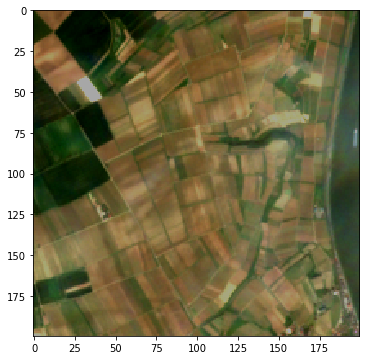

month: june


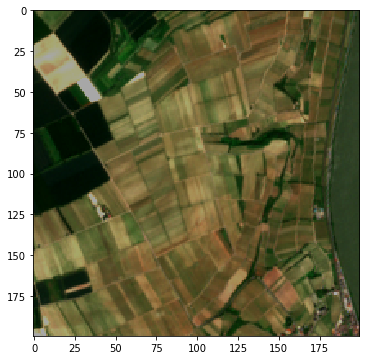

month: july


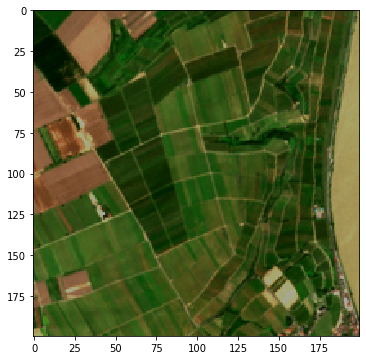

month: september


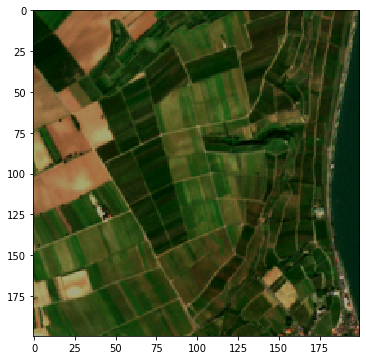

month: october


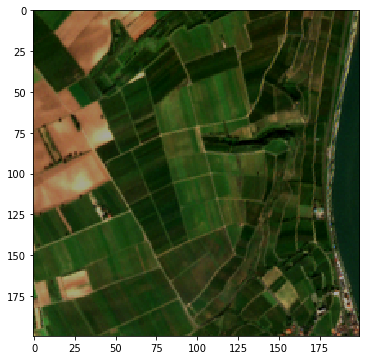

month: december


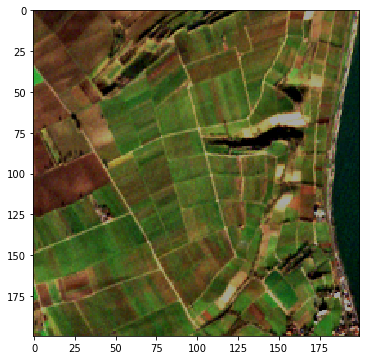

In [350]:
# Create RGB natural color composite
for m,month in enumerate(date_and_time.keys()):
    rgb = np.dstack((all_images_vine[m][0], all_images_vine[m][1], all_images_vine[m][2]))
    p2, p98 = np.percentile(rgb, (2,98))
    image = exposure.rescale_intensity(rgb, in_range=(p2, p98)) / 100000
    plt.figure(figsize=(6,6))
    print(f'month: {month}')
    show(image.transpose(2,0,1))

In [351]:
all_ndvis_vine = np.zeros(shape=(len(date_and_time.keys()),200,200))

for m,month in enumerate(date_and_time.keys()):
    ndvi_month=np.where((all_images_vine[m][3]+all_images_vine[m][0])==0, 0, (all_images_vine[m][3]-all_images_vine[m][0])/(all_images_vine[m][3]+all_images_vine[m][0]))
    ndvi_month_corrected=np.zeros(shape=[200, 200])
    for i in range(200):
        ndvirow=ndvi_month[i].tolist()
        ndvi_month_corrected[i]=np.asarray([0.0 if x>1 else x for x in ndvirow])
    all_ndvis_vine[m]=ndvi_month_corrected

NDVI march


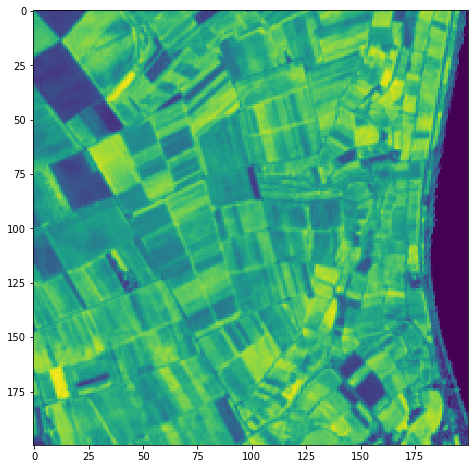

NDVI may


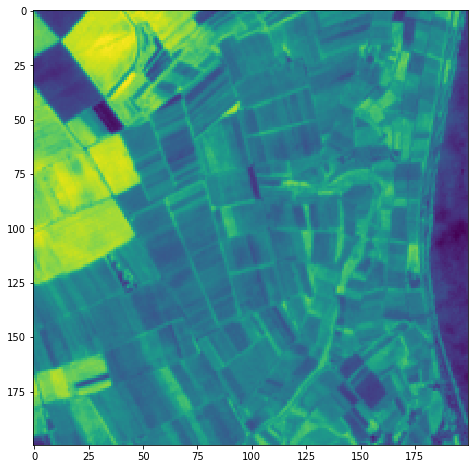

NDVI june


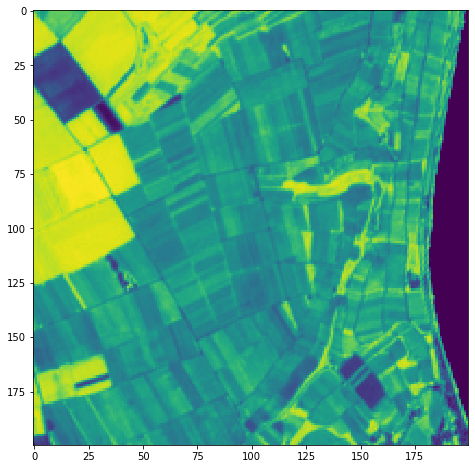

NDVI july


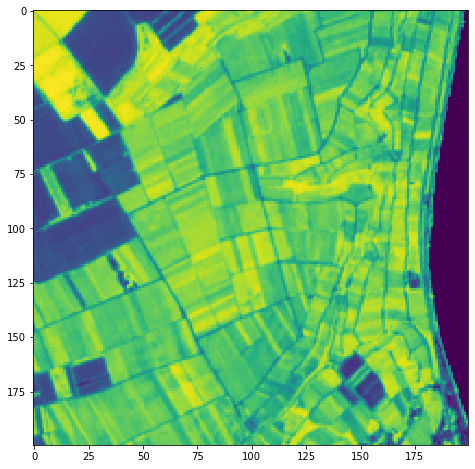

NDVI september


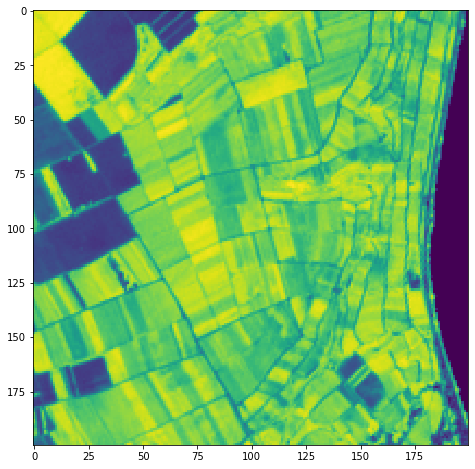

NDVI october


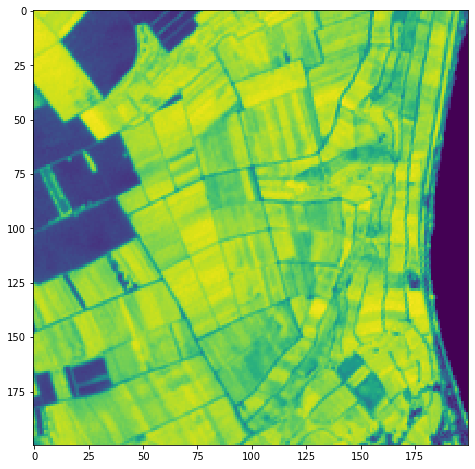

NDVI december


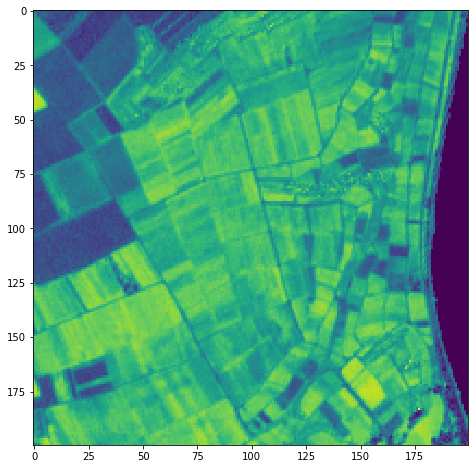

In [352]:
for m,month in enumerate(date_and_time.keys()):
    print(f'NDVI {month}')
    plt.figure(figsize=(8,8))
    show(all_ndvis_vine[m])


Text(0.5, 1.0, 'change of (summed) NDVI over time')

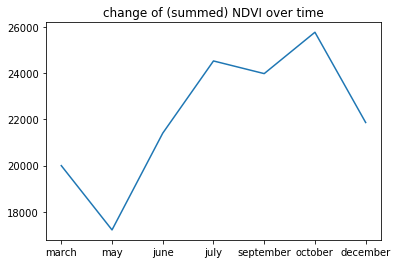

In [353]:
month_2021, sum_of_ndvi =[],[]
for m,month in enumerate(date_and_time.keys()):
    month_2021.append(month)
    sum_of_ndvi.append(np.sum(all_ndvis_vine[m]))
    
plt.plot(month_2021, sum_of_ndvi)
plt.title('change of (summed) NDVI over time')

The drop between March and May may be due to cutting of the wine plant or soil tillage between the vine plants. 

### 2.4 Calculating the NDVI for an Urban Area (Mainz)

In [354]:
nofMainz=-5500  #north of Mainz in m (negative if south)
eofMainz=5500  #east of Mainz in m (negative if west)
sizeinm=2000
top=MZtop+nofMainz
left=MZleft+eofMainz
bottom=top-sizeinm
right=left+sizeinm

In [355]:
all_images_urban = np.zeros(shape=(len(date_and_time.keys()),len(selected_bands),int(sizeinm/10),int(sizeinm/10)),dtype=np.uint16)
for m,month in enumerate(date_and_time.keys()):
    for b,band in enumerate(selected_bands):
        with rasterio.open(imagePath+month+' 21 bands 2348/T32UMA_'+date_and_time[month]+'_'+band+'_10m.jp2', driver='JP2OpenJPEG') as src:
            all_images_urban[m][b] = src.read(1,window=from_bounds(left, bottom, right, top, src.transform))

month: march


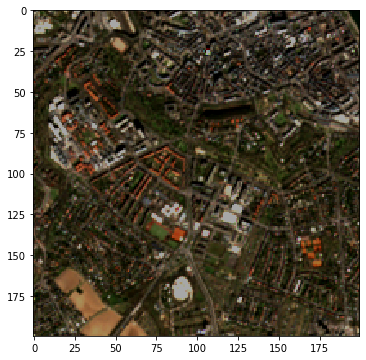

month: may


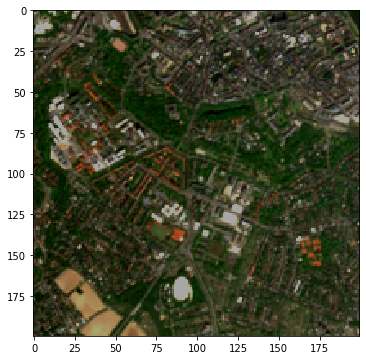

month: june


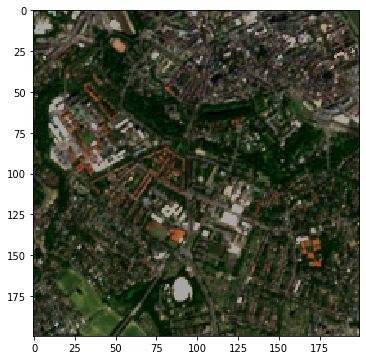

month: july


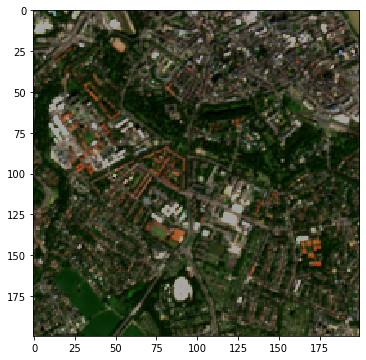

month: september


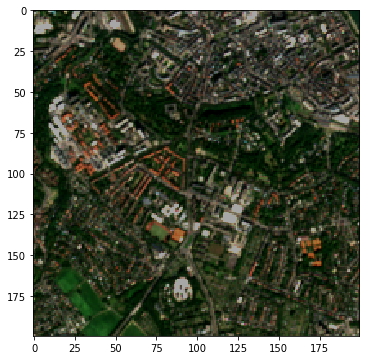

month: october


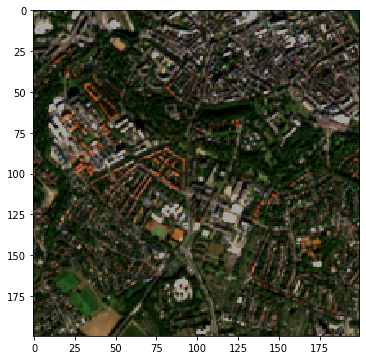

month: december


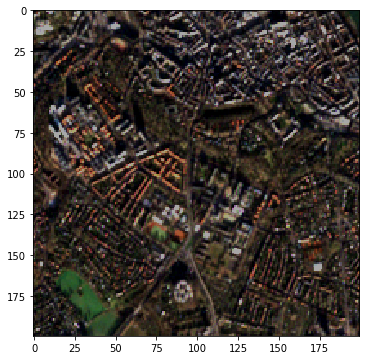

In [356]:
# Create RGB natural color composite
for m,month in enumerate(date_and_time.keys()):
    rgb = np.dstack((all_images_urban[m][0], all_images_urban[m][1], all_images_urban[m][2]))
    p2, p98 = np.percentile(rgb, (2,98))
    image = exposure.rescale_intensity(rgb, in_range=(p2, p98)) / 100000
    plt.figure(figsize=(6,6))
    print(f'month: {month}')
    show(image.transpose(2,0,1))

In [357]:
all_ndvis_urban = np.zeros(shape=(len(date_and_time.keys()),200,200))

for m,month in enumerate(date_and_time.keys()):
    ndvi_month=np.where((all_images_urban[m][3]+all_images_urban[m][0])==0, 0, (all_images_urban[m][3]-all_images_urban[m][0])/(all_images_urban[m][3]+all_images_urban[m][0]))
    ndvi_month_corrected=np.zeros(shape=[200, 200])
    for i in range(200):
        ndvirow=ndvi_month[i].tolist()
        ndvi_month_corrected[i]=np.asarray([0.0 if x>1 else x for x in ndvirow])
    all_ndvis_urban[m]=ndvi_month_corrected

C:\Users\Josef\Anaconda3\lib\site-packages\ipykernel_launcher.py:4: RuntimeWarning: invalid value encountered in true_divide
  after removing the cwd from sys.path.


NDVI march


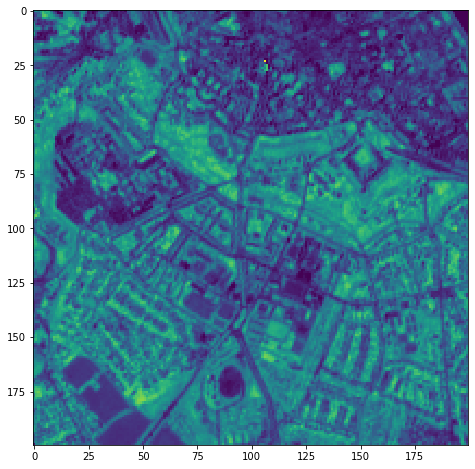

NDVI may


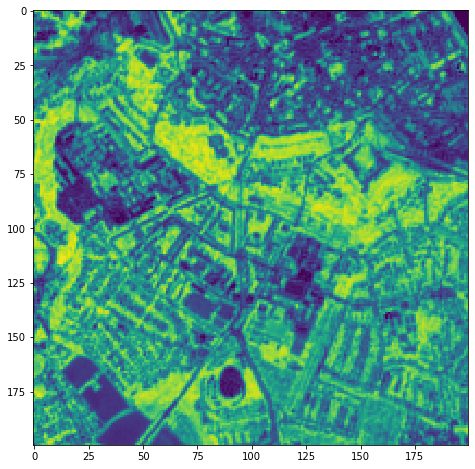

NDVI june


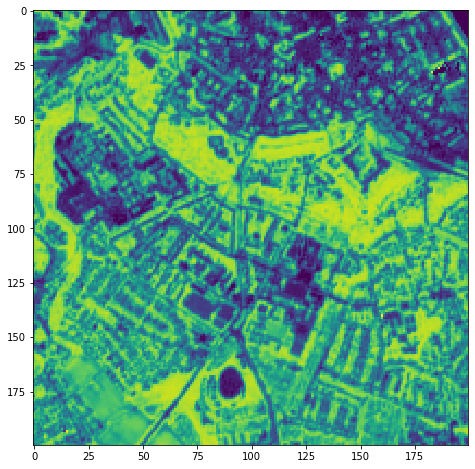

NDVI july


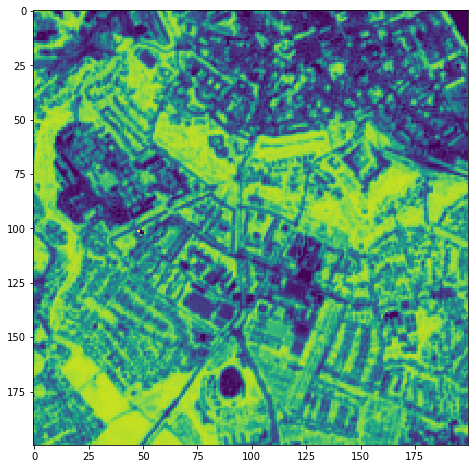

NDVI september


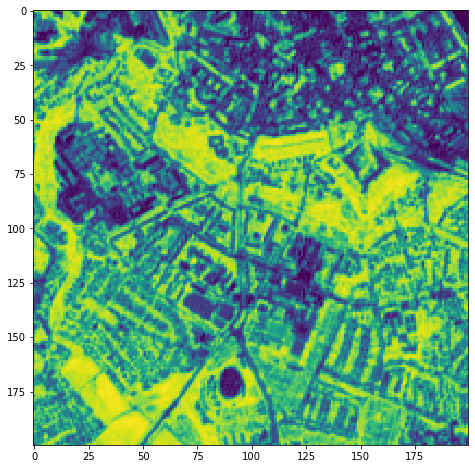

NDVI october


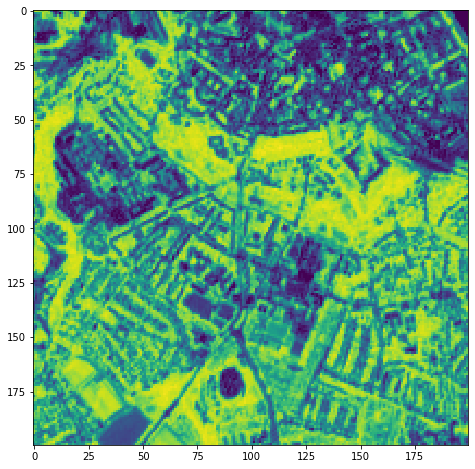

NDVI december


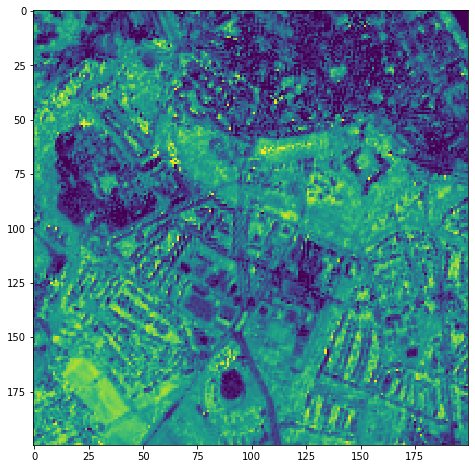

In [358]:
for m,month in enumerate(date_and_time.keys()):
    print(f'NDVI {month}')
    plt.figure(figsize=(8,8))
    show(all_ndvis_urban[m])


Text(0.5, 1.0, 'change of (summed) NDVI over time')

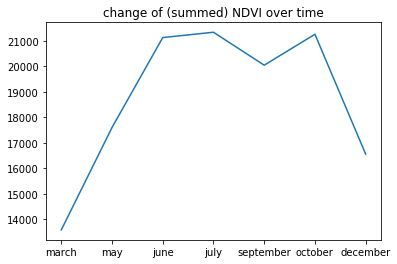

In [359]:
month_2021, sum_of_ndvi =[],[]
for m,month in enumerate(date_and_time.keys()):
    month_2021.append(month)
    sum_of_ndvi.append(np.sum(all_ndvis_urban[m]))
    
plt.plot(month_2021, sum_of_ndvi)
plt.title('change of (summed) NDVI over time')

Note that the NDVI still varies between seasons, mainly because of the trees and gardens in the city. 

### 3. Comparing all NDVIs

In [360]:
landuse_types=['cropland', 'forest', 'vine', 'urban']
landuse_types_ndvis=[all_ndvis_cropland, all_ndvis_forest, all_ndvis_vine, all_ndvis_urban]
all_ndvis={'month':[],'landuse_type':[], 'summed_NDVI':[]}
for i, lut in enumerate(landuse_types):
    for m,month in enumerate(date_and_time.keys()):
        all_ndvis['month'].append(month)
        all_ndvis['landuse_type'].append(lut)
        all_ndvis['summed_NDVI'].append(np.sum(landuse_types_ndvis[i][m]))

In [361]:
all_ndvis_df=pd.DataFrame(all_ndvis)

Text(0.5, 1.0, 'Comparison of NDVIs from different land types')

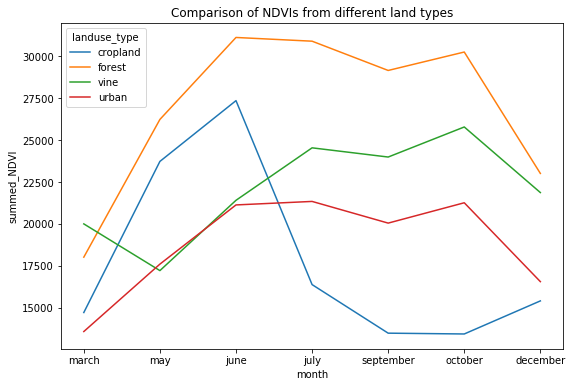

In [368]:
plt.figure(figsize=(9,6))
sns.lineplot(x="month", y="summed_NDVI", data=all_ndvis_df, hue='landuse_type')
plt.title('Comparison of NDVIs from different land types')